# Actividad Integradora TC2008b
### Jorge Emiliano Pomar A01709338

### Descripción
En esta actividad se simula un almacén con robots que deben apilar cajas en pilas de 5 cajas.
Los robots pueden moverse en las 4 direcciones y pueden cargar una caja a la vez.
### Parámetros
- 20x20: Tamaño del almacén
- 5: Número de cajas que contiene cada pila
- 5: Número de robots (agentes)
- 200 cajas posicionadas aleatoriamente en el almacén
- Robots se mueven en las 4 direcciones de manera aleatoria
- Robots pueden cargar una caja a la vez
- La semilla para la generación de números aleatorios es 67890
- Las cajas están en grupos de 1 a 3 cajas

In [95]:
from mesa import Agent, Model
from mesa.space import MultiGrid
from mesa.time import RandomActivation
import random

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

%matplotlib inline

C:\Users\pomar\AppData\Local\Temp\ipykernel_9628\392076896.py:3: FutureWarning: The Mesa Model class was not initialized. In the future, you need to explicitly initialize the Model by calling super().__init__() on initialization.
  super().__init__(unique_id, model)
C:\Users\pomar\AppData\Local\Temp\ipykernel_9628\392076896.py:133: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle(pos, 1, 1, color='blue', alpha=0.5, zorder=1, edgecolor='black', linewidth=0.5, linestyle='solid', hatch='//'))
C:\Users\pomar\AppData\Local\Temp\ipykernel_9628\392076896.py:137: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle(pos, 1, 1, color='gray', alpha=0.5, zorder=1, edgecolor='black', linewidth=0.5, linestyle='solid', hatch='//'))


Simulación en 1 pasos.
Robots restantes: 5
Cajas restantes: 195
Simulación en 2 pasos.
Robots restantes: 5
Cajas restantes: 200
Simulación en 3 pasos.
Robots restantes: 5
Cajas restantes: 197
Simulación en 4 pasos.
Robots restantes: 5
Cajas restantes: 198
Simulación en 5 pasos.
Robots restantes: 5
Cajas restantes: 199
Simulación en 6 pasos.
Robots restantes: 5
Cajas restantes: 197
Simulación en 7 pasos.
Robots restantes: 5
Cajas restantes: 198
Simulación en 8 pasos.
Robots restantes: 5
Cajas restantes: 197
Simulación en 9 pasos.
Robots restantes: 5
Cajas restantes: 199
Simulación en 10 pasos.
Robots restantes: 5
Cajas restantes: 196
Simulación en 11 pasos.
Robots restantes: 5
Cajas restantes: 199
Simulación en 12 pasos.
Robots restantes: 5
Cajas restantes: 197
Simulación en 13 pasos.
Robots restantes: 5
Cajas restantes: 199
Simulación en 14 pasos.
Robots restantes: 5
Cajas restantes: 196
Simulación en 15 pasos.
Robots restantes: 5
Cajas restantes: 199
Simulación en 16 pasos.
Robots res

Simulación en 202 pasos.
Robots restantes: 5
Cajas restantes: 196


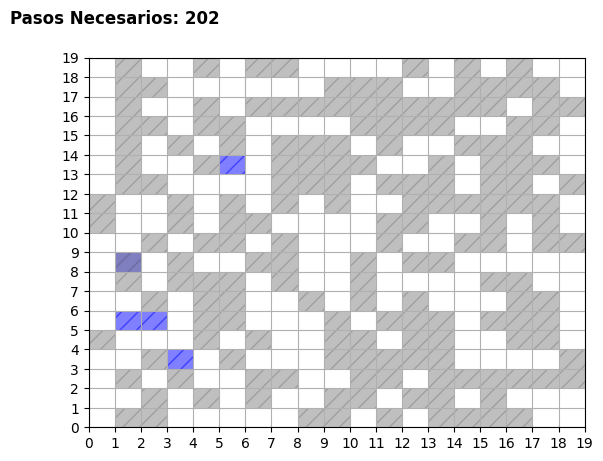

In [96]:
# agente RobotLimpieza 
class RobotLimpieza(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.cargar = []

    # Función para moverse de manera aleatoria en un rango de posibles celdas
    def AvanzaCelda(self):
        possible_steps = self.model.grid.get_neighborhood(
            self.pos,
            moore=False,
            include_center=False)
        possible_steps = [step for step in possible_steps if self.model.grid.is_cell_empty(step)]
        if possible_steps:
            new_position = self.random.choice(possible_steps)
            self.model.grid.move_agent(self, new_position)
    
    # Función para encontrar la celda con cajas
    def CeldaCaja(self):
        for cell in self.model.grid.coord_iter():
            cell_content, (x, y) = cell
            if any(isinstance(obj, Caja) for obj in cell_content):
                return(x, y)
        return None
    
    # Función para encontrar la celda vacía p con menos de 5 cajas apiladas
    def CeldaVacia(self):
        for cell in self.model.grid.coord_iter():
            cell_content, (x, y) = cell
            nCajas = sum(1 for obj in cell_content if isinstance(obj, Caja))
            if nCajas < 5:
                return (x, y)
        return None

    # Función para encontrar y cargar cajas
    def CargarCaja(self):
        x, y = self.pos 
        for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
            neighbor = (x + dx, y + dy)
            if self.model.grid.out_of_bounds(neighbor):
                continue
            neighbor_content = self.model.grid.get_cell_list_contents([(neighbor)])
            for obj in neighbor_content:
                if isinstance(obj, Caja) and len(self.cargar) < 5:
                    self.cargar.append(obj)
                    self.model.grid.remove_agent(obj)
                    return

    # Función para descargar cajas en celdas vacías
    def DescargarCaja(self):
        if len(self.cargar) > 0:
            caja = self.cargar.pop()
            self.model.grid.place_agent(caja, self.pos)

    # cada step, el robot se mueve, carga y descarga cajas
    def step(self):
        if len(self.cargar) == 0:
            self.CargarCaja()
            self.AvanzaCelda()
        else:
            self.AvanzaCelda()
            self.DescargarCaja()

# agente Caja            
class Caja(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)

# modelo AlmacenModel que define el grid y la cantidad de agentes        
class AlmacenModel(Model):
    def __init__(self, width, height, N, nCajas):
        self.num_agents = N
        self.grid = MultiGrid(width, height, False)
        self.schedule = RandomActivation(self)
        self.running = True
        self.steps = 0 # empezamos a contar los pasos
        
        # Creamos los agentes y los ponemos en el grid de manera aleatoria
        for i in range(self.num_agents):
            a = RobotLimpieza(i, self)
            self.schedule.add(a)
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            while not self.grid.is_cell_empty((x, y)):
                x = self.random.randrange(self.grid.width)
                y = self.random.randrange(self.grid.height)
            self.grid.place_agent(a, (x, y))

        # Creamos las cajas y las ponemos en el grid de manera aleatoria
        for i in range(nCajas):
            c = Caja(i + self.num_agents, self)
            self.schedule.add(c)
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            while not self.grid.is_cell_empty((x, y)):
                x = self.random.randrange(self.grid.width)
                y = self.random.randrange(self.grid.height)
            self.grid.place_agent(c, (x, y))

    # Función para contar las cajas adyacentes
    def adyacencias(self, x, y):
        count = 0
        for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
            neighbor = (x + dx, y + dy)
            if not self.grid.out_of_bounds(neighbor):
                neighbor_content = self.grid.get_cell_list_contents([neighbor])
                count += sum(1 for obj in neighbor_content if isinstance(obj, Caja))
        return count
    
    # utilizando la función adyacencias, se verifica si hay menos de 5 cajas apiladas 
    def step(self):
        self.schedule.step()
        self.steps += 1
        self.no_apiladas = []
        for cell in self.grid.coord_iter():
            cell_content, (x, y) = cell
            nCajas = sum(1 for obj in cell_content if isinstance(obj, Caja)) 
            if (nCajas > 0 and self.adyacencias(x, y) < 5): # si hay cajas y menos de 5 cajas apiladas, se añade a la lista de cajas no apiladas
                self.no_apiladas.append((x, y))
        if len(self.no_apiladas) == 0: # si todas las cajas ya se apilaron en 5 o mas, se detiene la simulación
            self.running = False

# Inicializacion de la semilla                 
random.seed(67890)
random.randint(1, 3) # cajas repartidas en grupos de 1 a 3
model = AlmacenModel(20, 20, 5, 200) # 5 robots y 200 cajas en el grid de 20x20
fig, ax = plt.subplots()

# Función para animar la simulación
def animate(frame):
    ax.clear()
    ax.set_xticks(range(20)) 
    ax.set_yticks(range(20))
    ax.grid(True)
    
    model.step() # se ejecuta un step del modelo en cada frame
    
    # posiciones de los robots y cajas
    pos_robots = [agent.pos for agent in model.schedule.agents if isinstance(agent, RobotLimpieza)]
    
    pos_cajas = [agent.pos for agent in model.schedule.agents if isinstance(agent, Caja)]

    # se añaden los agentes y las cajas al grid si no son None
    for pos in pos_robots:
        if pos is not None:
            ax.add_patch(plt.Rectangle(pos, 1, 1, color='blue', alpha=0.5, zorder=1, edgecolor='black', linewidth=0.5, linestyle='solid', hatch='//'))
    
    for pos in pos_cajas:
        if pos is not None:
            ax.add_patch(plt.Rectangle(pos, 1, 1, color='gray', alpha=0.5, zorder=1, edgecolor='black', linewidth=0.5, linestyle='solid', hatch='//'))
    
    # imprimir número de pasos, robots y cajas restantes mientras corre la simulación
    ax.text(1,21, 'Pasos Necesarios: ' + str(model.steps), fontsize=12, fontweight='bold', color='black', verticalalignment='center', horizontalalignment='center')
    
    print(f'Simulación en {model.steps} pasos.')
    print(f'Robots restantes: {len(pos_robots)}')
    print(f'Cajas restantes: {len(model.no_apiladas)}')

# para ejecutar la animación
anim = FuncAnimation(fig, animate, frames = 200, repeat=False)
anim
